## File ingestion
Ingest transcript data from 2017 to 2018 and pick a single stock for further NLP analysis.

In [1]:
import pandas as pd
data1 = pd.read_csv('data/2017firsthalf.txt', sep="\t", encoding='latin-1', dtype={'componentText': str})
data2 = pd.read_csv('data/2017secondhalf.txt', sep="\t", encoding='latin-1', dtype={'componentText': str})
data3 = pd.read_csv('data/2018.txt', sep="\t", encoding='latin-1', dtype={'componentText': str})

In [2]:
df = pd.concat([data1, data2, data3])

In [3]:
df.head()

,objectId,transcriptcreationdateUTC,componentText
0,106335,2017-01-04 15:40:41.000,Good morning. My name is Kalia and I will be y...
1,106335,2017-01-04 15:40:41.000,"Thank you, Kalia, and welcome, everyone, to Fo..."
2,106335,2017-01-04 15:40:41.000,"Thank you, Erich, and Happy New Year to everyo..."
3,106335,2017-01-04 15:40:41.000,"Great. Thanks, Mark. And welcome, everyone, to..."
4,106335,2017-01-04 15:40:41.000,"Thank you, Emily. And I'm just going to take a..."


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 559134 entries, 0 to 290801
Data columns (total 3 columns):
objectId                     559134 non-null int64
transcriptcreationdateUTC    559134 non-null object
componentText                559134 non-null object
dtypes: int64(1), object(2)
memory usage: 17.1+ MB


In [5]:
# single out Ford 
df_subset = df[df['objectId']==106335]

In [6]:
df_subset['date'] = pd.to_datetime(df_subset['transcriptcreationdateUTC'])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [7]:
df_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14965 entries, 0 to 282588
Data columns (total 4 columns):
objectId                     14965 non-null int64
transcriptcreationdateUTC    14965 non-null object
componentText                14965 non-null object
date                         14965 non-null datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 584.6+ KB


## Data Wrangling
Preprocess transcript data with SpaCy: stopwords, punctuations, lemmatization, etc

In [8]:
import spacy
from spacy import displacy

In [9]:
# #Install the corpus en_core_web_sm
# pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.1.0/en_core_web_sm-2.1.0.tar.gz


In [10]:
import en_core_web_sm
from  spacy.lang.en.stop_words import STOP_WORDS
nlp = en_core_web_sm.load()

In [11]:
# To build a list of stop words for filtering
stopwords = list(STOP_WORDS)
print(stopwords)

['eleven', 'three', 'though', 'these', 'sometimes', 'hereupon', 'within', 'unless', 'on', 'when', 'go', 'two', 'anyway', 'serious', 'of', 'each', 'again', 'please', 'it', 'almost', 'neither', 'toward', 'while', 'herein', 'thereafter', 'perhaps', 'beforehand', 'my', 'been', 'give', 'was', 'without', 'down', 'nobody', 'noone', 'such', 'various', 'whenever', 'to', 'all', 'least', 'more', 'that', 'around', 'third', 'somewhere', 'over', 'and', 'during', 'via', 'those', 'six', 'beside', 'rather', 'nothing', 'however', 'someone', 'an', 'although', 'former', 'last', 'would', 'anywhere', 'beyond', 'be', 'everywhere', 'between', 'keep', 'put', 'should', 'besides', 'too', 'because', 'first', 'our', 'part', 'where', 'often', 'enough', 'is', 'me', 'elsewhere', 'becoming', 'myself', 'therefore', 'at', 'itself', 'his', 'another', 'out', "'m", 'wherever', 'off', 'get', 'five', 'already', 'wherein', 'hereby', 'amount', 'else', 'what', 'yourself', 'did', 'only', 'seemed', 'further', 'him', 'must', 'us',

In [12]:
# Customizing the stop words list
stopwords.append('yes')
stopwords.append('no')
stopwords.append('thank')
print(stopwords)

['eleven', 'three', 'though', 'these', 'sometimes', 'hereupon', 'within', 'unless', 'on', 'when', 'go', 'two', 'anyway', 'serious', 'of', 'each', 'again', 'please', 'it', 'almost', 'neither', 'toward', 'while', 'herein', 'thereafter', 'perhaps', 'beforehand', 'my', 'been', 'give', 'was', 'without', 'down', 'nobody', 'noone', 'such', 'various', 'whenever', 'to', 'all', 'least', 'more', 'that', 'around', 'third', 'somewhere', 'over', 'and', 'during', 'via', 'those', 'six', 'beside', 'rather', 'nothing', 'however', 'someone', 'an', 'although', 'former', 'last', 'would', 'anywhere', 'beyond', 'be', 'everywhere', 'between', 'keep', 'put', 'should', 'besides', 'too', 'because', 'first', 'our', 'part', 'where', 'often', 'enough', 'is', 'me', 'elsewhere', 'becoming', 'myself', 'therefore', 'at', 'itself', 'his', 'another', 'out', "'m", 'wherever', 'off', 'get', 'five', 'already', 'wherein', 'hereby', 'amount', 'else', 'what', 'yourself', 'did', 'only', 'seemed', 'further', 'him', 'must', 'us',

In [13]:
# Building the punctuation list
import string
punctuations = string.punctuation

# Creating a Spacy Parser
from spacy.lang.en import English
parser = English()


In [108]:
parser.max_length = 2500000

In [14]:
# lemmatize, use lower_case, remove pronouns, stopwords and punctuations
def my_tokenizer(sentence):
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]
    return mytokens

## Import Vader lexicon for sentiment analysis

In [15]:
# Import Vader Sentiment Analysis
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

In [16]:
df_subset_vader = df_subset

In [17]:
%%time
df_subset_vader['componentText_tokenized'] = df_subset_vader['componentText'].apply(lambda x: my_tokenizer(x))

CPU times: user 11.3 s, sys: 32.7 ms, total: 11.4 s
Wall time: 11.4 s


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [18]:
%%time
df_subset_vader['componentText_processed'] = df_subset_vader['componentText_tokenized'].apply(lambda x: ' '.join(x))

CPU times: user 24.6 ms, sys: 2.54 ms, total: 27.2 ms
Wall time: 26.1 ms


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [19]:
%%time
df_subset_vader['componentText_sid'] = df_subset_vader['componentText_processed'].apply(lambda x: sid.polarity_scores(x))

CPU times: user 6.77 s, sys: 13.8 ms, total: 6.79 s
Wall time: 6.79 s


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [20]:
#df_subset_vader

In [21]:
df_subset_vader['pos'] = df_subset_vader['componentText_sid'].apply(lambda x: x['pos'])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [22]:
df_subset_vader['neg'] = df_subset_vader['componentText_sid'].apply(lambda x: x['neg'])

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


## EDA with Plotly

In [23]:
import plotly.express as px
df = px.data.tips()
fig = px.histogram(df_subset_vader, x="pos")
fig.show()

In [24]:
import plotly.graph_objects as go


x0 = df_subset_vader['pos']
# Add 1 to shift the mean of the Gaussian distribution
x1 = df_subset_vader['neg']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0,name="Positive"))
fig.add_trace(go.Histogram(x=x1,name="Negative"))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [25]:
x0 = df_subset_vader[df_subset_vader['pos']!=0]['pos']
x1 = df_subset_vader[df_subset_vader['neg']!=0]['neg']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0,name="Positive"))
fig.add_trace(go.Histogram(x=x1,name="Negative"))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [26]:
# Consolidate the text based on dates
df_subset_vader['month'] = df_subset_vader['date'].apply(lambda x: x.month)
df_subset_vader['year'] = df_subset_vader['date'].apply(lambda x: x.year)
df_subset_consolidated=df_subset_vader.groupby(['objectId','year','month'])['componentText_processed'].apply(' '.join)

In [27]:
# Convert data series to pandas data frame
df_subset_consolidated = pd.DataFrame(df_subset_consolidated)

In [28]:
# df_subset_consolidated

In [29]:
%%time
df_subset_consolidated['componentText_sid'] = df_subset_consolidated['componentText_processed'].apply(lambda x: sid.polarity_scores(x))
df_subset_consolidated['pos'] = df_subset_consolidated['componentText_sid'].apply(lambda x: x['pos'])
df_subset_consolidated['neg'] = df_subset_consolidated['componentText_sid'].apply(lambda x: x['neg'])

CPU times: user 40.3 s, sys: 41.6 ms, total: 40.3 s
Wall time: 40.4 s


In [30]:
# df_subset_consolidated

In [31]:
def pos_neg_dist(df): 

    # filter out zeros

    x0 = df[df['pos']!=0]['pos']
    x1 = df[df['neg']!=0]['neg']

    fig = go.Figure()
    fig.add_trace(go.Histogram(x=x0,name="Positive"))
    fig.add_trace(go.Histogram(x=x1,name="Negative"))

    # Overlay both histograms
    fig.update_layout(barmode='overlay')
    # Reduce opacity to see both histograms
    fig.update_traces(opacity=0.75)
    
    fig.update_layout(
        legend=dict(
            x=0.43,
            y=1,
            traceorder="reversed",
            title_font_family="Times New Roman",
            font=dict(
                family="Courier",
                size=12,
                color="black"
            ),
            bgcolor="LightSteelBlue",
            bordercolor="Black",
            borderwidth=2
        )
    )
    fig.show()

In [32]:
pos_neg_dist(df_subset_consolidated)

## BERT (Bidirectional Encoder Representations from Transformers)

In [33]:
# #Install BERT 
# !/opt/anaconda3/bin/pip install bert-extractive-summarizer

In [34]:
# !/opt/anaconda3/bin/pip install spacy==2.1.3
# !/opt/anaconda3/bin/pip install transformers==2.2.2
# !/opt/anaconda3/bin/pip install neuralcoref

In [35]:
from summarizer import Summarizer

In [36]:
body = '''
The Chrysler Building, the famous art deco New York skyscraper, will be sold for a small fraction of its previous sales price.
The deal, first reported by The Real Deal, was for $150 million, according to a source familiar with the deal.
Mubadala, an Abu Dhabi investment fund, purchased 90% of the building for $800 million in 2008.
Real estate firm Tishman Speyer had owned the other 10%.
The buyer is RFR Holding, a New York real estate company.
Officials with Tishman and RFR did not immediately respond to a request for comments.
It's unclear when the deal will close.
The building sold fairly quickly after being publicly placed on the market only two months ago.
The sale was handled by CBRE Group.
The incentive to sell the building at such a huge loss was due to the soaring rent the owners pay to Cooper Union, a New York college, for the land under the building.
The rent is rising from $7.75 million last year to $32.5 million this year to $41 million in 2028.
Meantime, rents in the building itself are not rising nearly that fast.
While the building is an iconic landmark in the New York skyline, it is competing against newer office towers with large floor-to-ceiling windows and all the modern amenities.
Still the building is among the best known in the city, even to people who have never been to New York.
It is famous for its triangle-shaped, vaulted windows worked into the stylized crown, along with its distinctive eagle gargoyles near the top.
It has been featured prominently in many films, including Men in Black 3, Spider-Man, Armageddon, Two Weeks Notice and Independence Day.
The previous sale took place just before the 2008 financial meltdown led to a plunge in real estate prices.
Still there have been a number of high profile skyscrapers purchased for top dollar in recent years, including the Waldorf Astoria hotel, which Chinese firm Anbang Insurance purchased in 2016 for nearly $2 billion, 
and the Willis Tower in Chicago, which was formerly known as Sears Tower, once the world's tallest.
Blackstone Group (BX) bought it for $1.3 billion 2015.
The Chrysler Building was the headquarters of the American automaker until 1953, but it was named for and owned by Chrysler chief Walter Chrysler, not the company itself.
Walter Chrysler had set out to build the tallest building in the world, a competition at that time with another Manhattan skyscraper under construction at 40 Wall Street at the south end of Manhattan. 
He kept secret the plans for the spire that would grace the top of the building, building it inside the structure and out of view of the public until 40 Wall Street was complete.
Once the competitor could rise no higher, the spire of the Chrysler building was raised into view, giving it the title.
'''

model = Summarizer()
result = model(body, min_length=10)
full = ''.join(result)
print(full)

The Chrysler Building, the famous art deco New York skyscraper, will be sold for a small fraction of its previous sales price. The buyer is RFR Holding, a New York real estate company. The incentive to sell the building at such a huge loss was due to the soaring rent the owners pay to Cooper Union, a New York college, for the land under the building. Meantime, rents in the building itself are not rising nearly that fast. The previous sale took place just before the 2008 financial meltdown led to a plunge in real estate prices.


In [37]:
%%time
df_subset_consolidated['bert'] = df_subset_consolidated['componentText_processed'].apply(lambda x: model(x, min_length=100))

CPU times: user 8min 50s, sys: 3.47 s, total: 8min 53s
Wall time: 1min 6s


In [38]:
print(df_subset_consolidated['componentText_processed'][0])


good morning kalia conference operator today time like welcome ford monthly sales conference operator instructions like turn host erich merkle u.s. sale analyst ahead kalia welcome ford december 2016 u.s. sales good morning today join mark laneve ford vice president u.s. marketing sales service emily kolinski morris ford chief economist kick thing ﻿1 industry ford perspective mark mark erich happy new year let look december transition couple year comment datum point believe industry follow strong november strong month december base morning early datum datum suggest total sale include medium heavy truck come 1.69 million vehicle december slight overall increase 1 versus year ago correspond total industry saar low mid-18 million vehicle range month december retail performance approximately 1 retail sale estimate 1.35 million 1.37 million vehicle high industry incentive spend 530 unit relative december 2015 correspond atp increase good year place industry base know 17.8 million total vehi

In [39]:
print(len(df_subset_consolidated['componentText_processed'][0]))

403885


In [40]:
print(df_subset_consolidated['bert'][0])

good morning kalia conference operator today time like welcome ford monthly sales conference operator instructions like turn host erich merkle u.s. run obviously numb effect policy impact import vehicle apply competitor import mexico europe asia need raise price offset adjustment absorb cost wonder widely expect price raise industry consumer willingness accept high price guess sort limit broadly thought potentially benefit market share price dan speak speculate policy regulation know build vast majority sell u.s. power ford lincoln brand finally talk lot highly profitable grow service organization consistently deliver strong result feel lot opportunity continue expand business world ancillary benefit highly profitable add customer satisfaction owner loyalty case u.s. expect small decline record level 2016 view market plateau tell strong level note sure question business environment u.s. f series 39 second sit dinner think sell -- know sell numb f series important business truck leader 

In [41]:
print(len(df_subset_consolidated['bert'][0]))

3751


In [42]:
print(f"The conpress ratio is {round(len(df_subset_consolidated['bert'][0])/len(df_subset_consolidated['componentText_processed'][0])*100,2)}%.")
      

The conpress ratio is 0.93%.


## Feature Engineering

In [43]:
df_subset_consolidated['bert_sid'] = df_subset_consolidated['bert'].apply(lambda x: sid.polarity_scores(x))
df_subset_consolidated['pos'] = df_subset_consolidated['bert_sid'].apply(lambda x: x['pos'])
df_subset_consolidated['neg'] = df_subset_consolidated['bert_sid'].apply(lambda x: x['neg'])

In [44]:
pos_neg_dist(df_subset_consolidated)

In [45]:
import plotly.graph_objs as go
import plotly.express as px

In [46]:
y = df_subset_consolidated.index.get_level_values('year')
m = df_subset_consolidated.index.get_level_values('month')

df_subset_consolidated['Date'] = pd.to_datetime(y * 100 + m, format="%Y%m")
# df_subset_consolidated['date'] = pd.to_datetime(df_subset_consolidated[['year', 'month']])

In [47]:
df_subset_consolidated['Date'] = pd.to_datetime(df_subset_consolidated['Date']).dt.date

In [48]:
df_subset_consolidated

componentText_processed  \
objectId year month                                                      
106335   2017 1      good morning kalia conference operator today t...   
              2      good morning kalia conference operator time li...   
              3      good morning stephanie conference operator tod...   
              4      good morning crystal conference operator today...   
              5      good morning kayla conference operator today t...   
              6      good morning khalia conference operator today ...   
              7      good morning christa conference operator today...   
              8      good morning khalia conference operator today ...   
              9      ladies gentleman stand welcome ford monthly sa...   
              10     good morning khalia conference operator today ...   
              11     good morning kalia conference operator today t...   
              12     good morning dorothy conference operator today...   
         2018 1      ladies gentleman stand welcome ford monthly sa...   
              2      good day carmen conference operator today time...   
              3      good morning nicole conference operator today ...   
              4      ladies gentleman stand welcome ford monthly sa...   
              5      good morning time like welcome ford monthly sa...   
              6      presentation ford motor company marcy klevorn ...   
              7      ladies gentleman stand welcome ford monthly sa...   
              8      good morning stephanie conference operator tod...   
              9      ladies gentleman stand welcome ford monthly sa...   
              10     audio gap mark laneve ford vice president u.s....   
              11     ladies gentleman stand welcome ford sales oper...   
              12     good morning marcella conference operator toda...   

                                                     componentText_sid    pos  \
objectId year month                                                             
106335   2017 1      {'neg': 0.036, 'neu': 0.709, 'pos': 0.255, 'co...  0.275   
              2      {'neg': 0.034, 'neu': 0.722, 'pos': 0.245, 'co...  0.421   
              3      {'neg': 0.037, 'neu': 0.725, 'pos': 0.237, 'co...  0.244   
              4      {'neg': 0.04, 'neu': 0.728, 'pos': 0.233, 'com...  0.228   
              5      {'neg': 0.041, 'neu': 0.69, 'pos': 0.268, 'com...  0.239   
              6      {'neg': 0.037, 'neu': 0.746, 'pos': 0.218, 'co...  0.243   
              7      {'neg': 0.033, 'neu': 0.709, 'pos': 0.258, 'co...  0.237   
              8      {'neg': 0.049, 'neu': 0.761, 'pos': 0.19, 'com...  0.224   
              9      {'neg': 0.069, 'neu': 0.727, 'pos': 0.204, 'co...  0.169   
              10     {'neg': 0.036, 'neu': 0.701, 'pos': 0.263, 'co...  0.245   
              11     {'neg': 0.034, 'neu': 0.703, 'pos': 0.263, 'co...  0.132   
              12     {'neg': 0.028, 'neu': 0.756, 'pos': 0.216, 'co...  0.405   
         2018 1      {'neg': 0.039, 'neu': 0.703, 'pos': 0.258, 'co...  0.206   
              2      {'neg': 0.043, 'neu': 0.736, 'pos': 0.221, 'co...  0.405   
              3      {'neg': 0.029, 'neu': 0.723, 'pos': 0.248, 'co...  0.309   
              4      {'neg': 0.037, 'neu': 0.721, 'pos': 0.241, 'co...  0.160   
              5      {'neg': 0.035, 'neu': 0.699, 'pos': 0.265, 'co...  0.206   
              6      {'neg': 0.034, 'neu': 0.729, 'pos': 0.237, 'co...  0.254   
              7      {'neg': 0.042, 'neu': 0.707, 'pos': 0.251, 'co...  0.387   
              8      {'neg': 0.038, 'neu': 0.716, 'pos': 0.246, 'co...  0.326   
              9      {'neg': 0.032, 'neu': 0.698, 'pos': 0.27, 'com...  0.243   
              10     {'neg': 0.034, 'neu': 0.703, 'pos': 0.263, 'co...  0.295   
              11     {'neg': 0.047, 'neu': 0.731, 'pos': 0.222, 'co...  0.302   
              12     {'neg': 0.035, 'neu': 0.719, 'pos': 0.246, 'co...  0.405   

               

In [49]:
from datetime import timedelta
from dateutil.relativedelta import *
df_subset_consolidated['Date'] = df_subset_consolidated['Date'] -relativedelta(days=1)+ relativedelta(months=+1)

In [50]:
df_subset_consolidated

componentText_processed  \
objectId year month                                                      
106335   2017 1      good morning kalia conference operator today t...   
              2      good morning kalia conference operator time li...   
              3      good morning stephanie conference operator tod...   
              4      good morning crystal conference operator today...   
              5      good morning kayla conference operator today t...   
              6      good morning khalia conference operator today ...   
              7      good morning christa conference operator today...   
              8      good morning khalia conference operator today ...   
              9      ladies gentleman stand welcome ford monthly sa...   
              10     good morning khalia conference operator today ...   
              11     good morning kalia conference operator today t...   
              12     good morning dorothy conference operator today...   
         2018 1      ladies gentleman stand welcome ford monthly sa...   
              2      good day carmen conference operator today time...   
              3      good morning nicole conference operator today ...   
              4      ladies gentleman stand welcome ford monthly sa...   
              5      good morning time like welcome ford monthly sa...   
              6      presentation ford motor company marcy klevorn ...   
              7      ladies gentleman stand welcome ford monthly sa...   
              8      good morning stephanie conference operator tod...   
              9      ladies gentleman stand welcome ford monthly sa...   
              10     audio gap mark laneve ford vice president u.s....   
              11     ladies gentleman stand welcome ford sales oper...   
              12     good morning marcella conference operator toda...   

                                                     componentText_sid    pos  \
objectId year month                                                             
106335   2017 1      {'neg': 0.036, 'neu': 0.709, 'pos': 0.255, 'co...  0.275   
              2      {'neg': 0.034, 'neu': 0.722, 'pos': 0.245, 'co...  0.421   
              3      {'neg': 0.037, 'neu': 0.725, 'pos': 0.237, 'co...  0.244   
              4      {'neg': 0.04, 'neu': 0.728, 'pos': 0.233, 'com...  0.228   
              5      {'neg': 0.041, 'neu': 0.69, 'pos': 0.268, 'com...  0.239   
              6      {'neg': 0.037, 'neu': 0.746, 'pos': 0.218, 'co...  0.243   
              7      {'neg': 0.033, 'neu': 0.709, 'pos': 0.258, 'co...  0.237   
              8      {'neg': 0.049, 'neu': 0.761, 'pos': 0.19, 'com...  0.224   
              9      {'neg': 0.069, 'neu': 0.727, 'pos': 0.204, 'co...  0.169   
              10     {'neg': 0.036, 'neu': 0.701, 'pos': 0.263, 'co...  0.245   
              11     {'neg': 0.034, 'neu': 0.703, 'pos': 0.263, 'co...  0.132   
              12     {'neg': 0.028, 'neu': 0.756, 'pos': 0.216, 'co...  0.405   
         2018 1      {'neg': 0.039, 'neu': 0.703, 'pos': 0.258, 'co...  0.206   
              2      {'neg': 0.043, 'neu': 0.736, 'pos': 0.221, 'co...  0.405   
              3      {'neg': 0.029, 'neu': 0.723, 'pos': 0.248, 'co...  0.309   
              4      {'neg': 0.037, 'neu': 0.721, 'pos': 0.241, 'co...  0.160   
              5      {'neg': 0.035, 'neu': 0.699, 'pos': 0.265, 'co...  0.206   
              6      {'neg': 0.034, 'neu': 0.729, 'pos': 0.237, 'co...  0.254   
              7      {'neg': 0.042, 'neu': 0.707, 'pos': 0.251, 'co...  0.387   
              8      {'neg': 0.038, 'neu': 0.716, 'pos': 0.246, 'co...  0.326   
              9      {'neg': 0.032, 'neu': 0.698, 'pos': 0.27, 'com...  0.243   
              10     {'neg': 0.034, 'neu': 0.703, 'pos': 0.263, 'co...  0.295   
              11     {'neg': 0.047, 'neu': 0.731, 'pos': 0.222, 'co...  0.302   
              12     {'neg': 0.035, 'neu': 0.719, 'pos': 0.246, 'co...  0.405   

               

In [51]:
df_price = pd.DataFrame([12.53,11.64,11.47,11.12,11.19,11.22,11.03,11.97,12.27,12.52,12.49,10.97,10.61,11.08,11.24,11.55,11.07,10.04,9.48,9.25,9.55,9.41,7.65,8.8], columns=['Price'])

In [52]:
df_stock = pd.concat([df_subset_consolidated['Date'].reset_index(), df_price['Price']], axis=1)


In [53]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# # Create figure with secondary y-axis
# fig = make_subplots(specs=[[{"secondary_y": True}]])

# # Add traces
# fig.add_trace(
#     go.Scatter(x=df_subset_consolidated['Date'], y=df_subset_consolidated['neg'], name='negative'),
#     secondary_y=False,
# )

# fig.add_trace(
#     go.Scatter(x=df_subset_consolidated['Date'], y=df_subset_consolidated['pos'], name='positive'),
#     secondary_y=False,
# )

# fig.add_trace(
#     go.Scatter(x=df_stock['Date'], y=df_stock['Price'], name='F'),
#     secondary_y=True,
# )

# # Add figure title
# fig.update_layout(
#     title_text="Ford stock price versus sentiment scores"
# )

# # Set x-axis title
# fig.update_xaxes(title_text="2017-2018")

# # Set y-axes titles
# fig.update_yaxes(title_text="<b>Sentiment Scores</b>", secondary_y=False)
# fig.update_yaxes(title_text="<b>Stock Price</b>", secondary_y=True)

# fig.show()

In [54]:
df_subset_consolidated

componentText_processed  \
objectId year month                                                      
106335   2017 1      good morning kalia conference operator today t...   
              2      good morning kalia conference operator time li...   
              3      good morning stephanie conference operator tod...   
              4      good morning crystal conference operator today...   
              5      good morning kayla conference operator today t...   
              6      good morning khalia conference operator today ...   
              7      good morning christa conference operator today...   
              8      good morning khalia conference operator today ...   
              9      ladies gentleman stand welcome ford monthly sa...   
              10     good morning khalia conference operator today ...   
              11     good morning kalia conference operator today t...   
              12     good morning dorothy conference operator today...   
         2018 1      ladies gentleman stand welcome ford monthly sa...   
              2      good day carmen conference operator today time...   
              3      good morning nicole conference operator today ...   
              4      ladies gentleman stand welcome ford monthly sa...   
              5      good morning time like welcome ford monthly sa...   
              6      presentation ford motor company marcy klevorn ...   
              7      ladies gentleman stand welcome ford monthly sa...   
              8      good morning stephanie conference operator tod...   
              9      ladies gentleman stand welcome ford monthly sa...   
              10     audio gap mark laneve ford vice president u.s....   
              11     ladies gentleman stand welcome ford sales oper...   
              12     good morning marcella conference operator toda...   

                                                     componentText_sid    pos  \
objectId year month                                                             
106335   2017 1      {'neg': 0.036, 'neu': 0.709, 'pos': 0.255, 'co...  0.275   
              2      {'neg': 0.034, 'neu': 0.722, 'pos': 0.245, 'co...  0.421   
              3      {'neg': 0.037, 'neu': 0.725, 'pos': 0.237, 'co...  0.244   
              4      {'neg': 0.04, 'neu': 0.728, 'pos': 0.233, 'com...  0.228   
              5      {'neg': 0.041, 'neu': 0.69, 'pos': 0.268, 'com...  0.239   
              6      {'neg': 0.037, 'neu': 0.746, 'pos': 0.218, 'co...  0.243   
              7      {'neg': 0.033, 'neu': 0.709, 'pos': 0.258, 'co...  0.237   
              8      {'neg': 0.049, 'neu': 0.761, 'pos': 0.19, 'com...  0.224   
              9      {'neg': 0.069, 'neu': 0.727, 'pos': 0.204, 'co...  0.169   
              10     {'neg': 0.036, 'neu': 0.701, 'pos': 0.263, 'co...  0.245   
              11     {'neg': 0.034, 'neu': 0.703, 'pos': 0.263, 'co...  0.132   
              12     {'neg': 0.028, 'neu': 0.756, 'pos': 0.216, 'co...  0.405   
         2018 1      {'neg': 0.039, 'neu': 0.703, 'pos': 0.258, 'co...  0.206   
              2      {'neg': 0.043, 'neu': 0.736, 'pos': 0.221, 'co...  0.405   
              3      {'neg': 0.029, 'neu': 0.723, 'pos': 0.248, 'co...  0.309   
              4      {'neg': 0.037, 'neu': 0.721, 'pos': 0.241, 'co...  0.160   
              5      {'neg': 0.035, 'neu': 0.699, 'pos': 0.265, 'co...  0.206   
              6      {'neg': 0.034, 'neu': 0.729, 'pos': 0.237, 'co...  0.254   
              7      {'neg': 0.042, 'neu': 0.707, 'pos': 0.251, 'co...  0.387   
              8      {'neg': 0.038, 'neu': 0.716, 'pos': 0.246, 'co...  0.326   
              9      {'neg': 0.032, 'neu': 0.698, 'pos': 0.27, 'com...  0.243   
              10     {'neg': 0.034, 'neu': 0.703, 'pos': 0.263, 'co...  0.295   
              11     {'neg': 0.047, 'neu': 0.731, 'pos': 0.222, 'co...  0.302   
              12     {'neg': 0.035, 'neu': 0.719, 'pos': 0.246, 'co...  0.405   

               

In [55]:
# Create figure with secondary y-axis

fig = make_subplots(rows=2, cols=1)

fig.append_trace(go.Scatter(x=df_stock['Date'], y=df_stock['Price'], name='F'
                           ), row=1, col=1)

fig.append_trace(go.Scatter(x=df_subset_consolidated['Date'], y=df_subset_consolidated['pos'], name='positive'
                           ), row=2, col=1)

fig.append_trace(go.Scatter(x=df_subset_consolidated['Date'], y=df_subset_consolidated['neg'], name='negative'
                           ), row=2, col=1)


fig.update_layout(height=1000, width=1000, title_text="F stock price versus sentiment scores")
fig.show()

## Hypothesis of trading on sentiment scores: A Contrarian View

In [56]:
#rolling_mean
df_subset_consolidated['avg_pos'] = df_subset_consolidated['pos'].rolling(12, min_periods=12).mean()
df_subset_consolidated['avg_neg'] = df_subset_consolidated['neg'].rolling(12, min_periods=12).mean()


In [57]:
fig = make_subplots(rows=3, cols=1)

fig.add_trace(go.Scatter(x=df_stock['Date'], y=df_stock['Price'], name='F'
                           ), row=1, col=1)

fig.add_trace(go.Scatter(x=df_subset_consolidated['Date'], y=df_subset_consolidated['pos'], name='positive'
                           ), row=2, col=1)
fig.add_trace(go.Scatter(x=df_subset_consolidated['Date'], y=df_subset_consolidated['avg_pos'], name='12M rolling avg positive'
                           ), row=2, col=1)

fig.add_trace(go.Scatter(x=df_subset_consolidated['Date'], y=df_subset_consolidated['neg'], name='negative'
                           ), row=3, col=1)
fig.add_trace(go.Scatter(x=df_subset_consolidated['Date'], y=df_subset_consolidated['avg_neg'], name='12M rolling avg negative'
                           ), row=3, col=1)

# add reference lines
for shape in fig.layout.shapes:
    shape["yref"]="paper"

fig.update_layout(height=1000, width=1000, title_text="F stock price versus sentiment scores")
fig.show()

In [58]:
df_subset_consolidated_copy = df_subset_consolidated.reset_index()

In [59]:
#df_subset_consolidated_copy

In [60]:
df_subset_consolidated_copy['strong_pos'] = df_subset_consolidated_copy['pos']>df_subset_consolidated_copy['avg_pos']

In [61]:
df_subset_consolidated_copy['weak_neg'] = df_subset_consolidated_copy['neg']<df_subset_consolidated_copy['avg_neg']

In [62]:
df_subset_consolidated_copy = df_subset_consolidated_copy.dropna()

In [63]:
def trade(df):
    if df['strong_pos'] == df['weak_neg']:
        if df['strong_pos'] is True:
            val = 'short'
        else:
            val = 'buy'
    else:
        val = 'hold'
    return val

In [64]:
df_subset_consolidated_copy['Trade'] =  df_subset_consolidated_copy.apply(trade, axis=1)

In [65]:
#df_subset_consolidated_copy

In [66]:
df_merged = pd.merge(df_stock,df_subset_consolidated_copy, on=['Date'])

In [67]:
#df_merged

In [68]:
df_merged['Profit'] = df_merged['Price'].shift(1)-df_merged['Price']

In [69]:
df_merged  = df_merged.dropna()

In [70]:
fig = go.Figure(go.Waterfall(
    name = "Profit/Loss Per Share (F)", orientation = "v",
 
    x = df_merged['Date'],
    textposition = "outside",
    text = round(df_merged['Profit'],2),
    y = df_merged['Profit'],
    connector = {"line":{"color":"rgb(63, 63, 63)"}},
))

fig.update_layout(
        title = "2018 Cumulative Montly Profit",
        showlegend = True
)

fig.show()

## Modeling

## 1.Train test split

In [116]:
#2017-2018 training set
train = pd.concat([data1, data2, data3])

In [117]:
# AMAZON, APPLE, NETFLIX, FACEBOOK, GOOGLE
stocks_of_interest = [18749, 24937, 32012, 20765463, 29096]
train = train[train.objectId.isin(stocks_of_interest)]

In [118]:
train['date'] = pd.to_datetime(train['transcriptcreationdateUTC'], format='%Y-%m-%d').dt.floor('d')

In [119]:
#train

In [120]:
# Consolidate the text based on dates
train_consolidated=train.groupby(['objectId','date'])['componentText'].apply(' '.join).reset_index()

In [121]:
train_consolidated

,objectId,date,componentText
0,18749,2017-02-02,"Thank you for standing by. Good day, everyone,..."
1,18749,2017-02-03,"Thank you for standing by. Good day, everyone,..."
2,18749,2017-02-06,"Thank you for standing by. Good day, everyone,..."
3,18749,2017-04-27,"Thank you for standing by. Good day, everyone,..."
4,18749,2017-04-28,"Thank you for standing by. Good day, everyone,..."
...,...,...,...
152,20765463,2018-07-25,"Good afternoon. My name is Mike, and I will be..."
153,20765463,2018-07-26,"Good afternoon. My name is Mike, and I will be..."
154,20765463,2018-10-30,"Good afternoon. My name is Mike, and I will be..."
155,20765463,2018-10-31,"Good afternoon. My name is Mike, and I will be..."


In [122]:
train_consolidated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157 entries, 0 to 156
Data columns (total 3 columns):
objectId         157 non-null int64
date             157 non-null datetime64[ns]
componentText    157 non-null object
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 3.8+ KB


In [123]:
%%time
parser.max_length = 2030000
train_consolidated['componentText_tokenized'] = train_consolidated['componentText'].apply(lambda x: my_tokenizer(x))


CPU times: user 11.7 s, sys: 8.2 ms, total: 11.7 s
Wall time: 11.7 s


In [124]:
%%time
train_consolidated['componentText_processed'] = train_consolidated['componentText_tokenized'].apply(lambda x: ' '.join(x))

CPU times: user 43 ms, sys: 1.09 ms, total: 44 ms
Wall time: 43 ms


In [125]:
train_consolidated

,objectId,date,componentText,componentText_tokenized,componentText_processed
0,18749,2017-02-02,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q4, 20...",stand good day welcome amazon.com q4 2016 fina...
1,18749,2017-02-03,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q4, 20...",stand good day welcome amazon.com q4 2016 fina...
2,18749,2017-02-06,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q4, 20...",stand good day welcome amazon.com q4 2016 fina...
3,18749,2017-04-27,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q1, 20...",stand good day welcome amazon.com q1 2017 fina...
4,18749,2017-04-28,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q1, 20...",stand good day welcome amazon.com q1 2017 fina...
...,...,...,...,...,...
152,20765463,2018-07-25,"Good afternoon. My name is Mike, and I will be...","[good, afternoon, mike, conference, operator, ...",good afternoon mike conference operator today ...
153,20765463,2018-07-26,"Good afternoon. My name is Mike, and I will be...","[good, afternoon, mike, conference, operator, ...",good afternoon mike conference operator today ...
154,20765463,2018-10-30,"Good afternoon. My name is Mike, and I will be...","[good, afternoon, mike, conference, operator, ...",good afternoon mike conference operator today ...
155,20765463,2018-10-31,"Good afternoon. My name is Mike, and I will be...","[good, afternoon, mike, conference, operator, ...",good afternoon mike conference operator today ...


In [126]:
from summarizer import Summarizer
model = Summarizer()

In [127]:
%%time
train_consolidated['bert'] = train_consolidated['componentText_processed'].apply(lambda x: model(x, min_length=100))

CPU times: user 14min 32s, sys: 2.93 s, total: 14min 35s
Wall time: 1min 49s


In [128]:
# Import Vader Sentiment Analysis
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

In [129]:
train_consolidated['bert_sid'] = train_consolidated['bert'].apply(lambda x: sid.polarity_scores(x))
train_consolidated['pos'] = train_consolidated['bert_sid'].apply(lambda x: x['pos'])
train_consolidated['neg'] = train_consolidated['bert_sid'].apply(lambda x: x['neg'])

In [130]:
pos_neg_dist(train_consolidated)

In [131]:
#12-period rolling_mean
train_consolidated = train_consolidated.sort_values(['objectId', 'date'])
train_consolidated['avg_pos'] = train_consolidated.groupby(['objectId'])['pos'].rolling(12).mean().reset_index(0,drop=True)
train_consolidated['avg_neg'] = train_consolidated.groupby(['objectId'])['neg'].rolling(12).mean().reset_index(0,drop=True)


In [132]:
train_consolidated['strong_pos'] = train_consolidated['pos']>train_consolidated['avg_pos']
train_consolidated['weak_neg'] = train_consolidated['neg']<train_consolidated['avg_neg']

In [133]:
# Create a copy of train_consolidated
# train_consolidated1 = train_consolidated.dropna()
# train_consolidated1['Trade'] =  train_consolidated1.apply(trade, axis=1)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [135]:
train_consolidated1 = train_consolidated

In [137]:
train_consolidated1.objectId.value_counts()

29096       36
24937       34
32012       33
20765463    32
18749       22
Name: objectId, dtype: int64

In [140]:
# AMAZON, APPLE, NETFLIX, FACEBOOK, GOOGLE
#stocks_of_interest = [18749, 24937, 32012, 20765463, 29096]
dic ={18749:'AMZN', 24937:'AAPL', 32012:'NFLX', 20765463:'FB', 29096:'GOOGL'}

In [141]:

train_consolidated1['ticker'] = train_consolidated1['objectId'].map(dic)

In [145]:
#train_consolidated1.drop(['ticker2'], axis=1, inplace=True)

In [146]:
train_consolidated1

,objectId,date,componentText,componentText_tokenized,componentText_processed,bert,bert_sid,pos,neg,avg_pos,avg_neg,strong_pos,weak_neg,ticker
0,18749,2017-02-02,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q4, 20...",stand good day welcome amazon.com q4 2016 fina...,result expect file 2016 form 10-k late typical...,"{'neg': 0.0, 'neu': 0.753, 'pos': 0.247, 'comp...",0.247,0.000,NaN,NaN,False,False,AMZN
1,18749,2017-02-03,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q4, 20...",stand good day welcome amazon.com q4 2016 fina...,result expect file 2016 form 10-k late typical...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000,0.000,NaN,NaN,False,False,AMZN
2,18749,2017-02-06,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q4, 20...",stand good day welcome amazon.com q4 2016 fina...,result expect file 2016 form 10-k late typical...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000,0.000,NaN,NaN,False,False,AMZN
3,18749,2017-04-27,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q1, 20...",stand good day welcome amazon.com q1 2017 fina...,bite quantification tell sort center think bui...,"{'neg': 0.0, 'neu': 0.643, 'pos': 0.357, 'comp...",0.357,0.000,NaN,NaN,False,False,AMZN
4,18749,2017-04-28,"Thank you for standing by. Good day, everyone,...","[stand, good, day, welcome, amazon.com, q1, 20...",stand good day welcome amazon.com q1 2017 fina...,globally launch prime video fall build global ...,"{'neg': 0.0, 'neu': 0.664, 'pos': 0.336, 'comp...",0.336,0.000,NaN,NaN,False,False,AMZN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152,20765463,2018-07-25,"Good afternoon. My name is Mike, and I will be...","[good, afternoon, mike, conference, operator, ...",good afternoon mike conference operator today ...,good afternoon mike conference operator today ...,"{'neg': 0.023, 'neu': 0.692, 'pos': 0.285, 'co...",0.285,0.023,0.231250,0.025167,True,True,FB
153,20765463,2018-07-26,"Good afternoon. My name is Mike, and I will be...","[good, afternoon, mike, conference, operator, ...",good afternoon mike conference operator today ...,good afternoon mike conference operator today ...,"{'neg': 0.0, 'neu': 0.744, 'pos': 0.256, 'comp...",0.256,0.000,0.252583,0.025167,True,True,FB
154,20765463,2018-10-30,"Good afternoon. My name is Mike, and I will be...","[good, afternoon, mike, conference, operator, ...",good afternoon mike conference operator today ...,good afternoon mike conference operator today ...,"{'neg': 0.0, 'neu': 0.641, 'pos': 0.359, 'comp...",0.359,0.000,0.282500,0.025167,True,True,FB
155,20765463,2018-10-31,"Good afternoon. My name is Mike, and I will be...","[good, afternoon, mike, conference, operator, ...",good afternoon mike conference operator today ...,good afternoon mike conference operator today ...,"{'neg': 0.0, 'neu': 0.781, 'pos': 0.219, 'comp...",0.219,0.000,0.272083,0.025167,False,True,FB


In [187]:
#conda install quandl
#!/opt/anaconda3/bin/pip install yfinance

In [153]:
# import quandl
# API_KEY = ' '
# quandl.ApiConfig.api_key = API_KEY

In [185]:
import yfinance as yf
tickers = ['AMZN', 'AAPL', 'NFLX', 'FB', 'GOOGL']
pricing = pd.DataFrame()

for ticker in tickers:
    data = yf.download(ticker, start="2017-01-01", end="2018-12-31")
    data['ticker'] = ticker
    pricing = pd.concat([pricing, data])

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [190]:
#pricing

In [210]:
train_consolidated2 = pd.merge(train_consolidated1, pricing, left_on=['date','ticker'], right_on=['Date','ticker'])

In [211]:
train_consolidated2['Previous_close'] = train_consolidated2.groupby(['ticker'])['Close'].shift(1)

In [212]:
train_consolidated2['Price_change'] = train_consolidated2['Previous_close']/train_consolidated2['Close']-1

In [213]:
train_consolidated2['Target'] = train_consolidated2['Price_change'].apply(lambda x: 1 if x>0 else 0)

In [214]:
train_consolidated2.columns

Index(['objectId', 'date', 'componentText', 'componentText_tokenized',
       'componentText_processed', 'bert', 'bert_sid', 'pos', 'neg', 'avg_pos',
       'avg_neg', 'strong_pos', 'weak_neg', 'ticker', 'Open', 'High', 'Low',
       'Close', 'Adj Close', 'Volume', 'Previous_close', 'Price_change',
       'Target'],
      dtype='object')

In [215]:
train_consolidated2.dropna(inplace=True)

In [249]:
columns_to_keep = ['pos', 'neg', 'avg_pos',
       'avg_neg', 'strong_pos', 'weak_neg',
       'Target']

In [250]:
train_consolidated2 = train_consolidated2[columns_to_keep]

In [251]:
train_consolidated2.isna().sum()

pos           0
neg           0
avg_pos       0
avg_neg       0
strong_pos    0
weak_neg      0
Target        0
dtype: int64

In [252]:
X = train_consolidated2.drop('Target', axis=1)

In [253]:
y = train_consolidated2['Target']

## Logistic Regression

In [254]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [255]:
X_train, X_test, y_train, y_test = train_test_split(
...     X, y, test_size=0.25, random_state=42)

In [256]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
print(accuracy_score(lr.predict(X_test), y_test))

0.5833333333333334


/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



In [286]:
rprobs = [0 for _ in range(len(y_test))]
lr_probs = lr.predict_proba(X_test)

In [288]:
lr_probs = lr_probs[:,1]

In [289]:
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,roc_auc_score

In [290]:
r_auc = roc_auc_score(y_test, rprobs)
lr_auc = roc_auc_score(y_test, lr_probs)

In [291]:
r_fpr, r_tpr, _ = roc_curve(y_test, rprobs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)

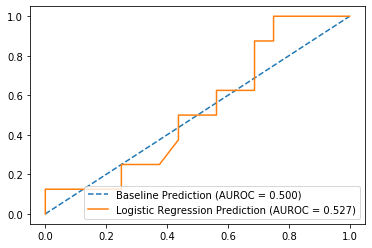

In [320]:
plt.plot(r_fpr, r_tpr, linestyle = '--', label='Baseline Prediction (AUROC = %0.3f)'%r_auc)
plt.plot(lr_fpr, lr_tpr, linestyle = '-', label='Logistic Regression Prediction (AUROC = %0.3f)'%lr_auc)
plt.legend()

## Gaussian Naive Bayes 

In [284]:
from sklearn.naive_bayes import GaussianNB

In [285]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)
print(accuracy_score(gnb.predict(X_test), y_test))

0.625


In [294]:
gnb_probs = gnb.predict_proba(X_test)
gnb_probs = gnb_probs[:,1]
gnb_auc = roc_auc_score(y_test, gnb_probs)
gnb_fpr, gnb_tpr, _ = roc_curve(y_test, gnb_probs)

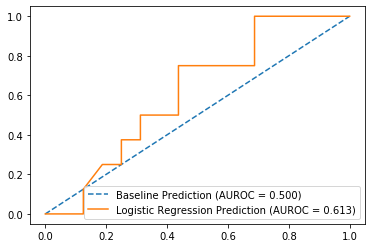

In [319]:
plt.plot(r_fpr, r_tpr, linestyle = '--', label='Baseline Prediction (AUROC = %0.3f)'%r_auc)
plt.plot(gnb_fpr, gnb_tpr, linestyle = '-', label='Logistic Regression Prediction (AUROC = %0.3f)'%gnb_auc)
plt.legend()

## Decision Tree

In [257]:
from sklearn import tree, metrics

In [258]:
# Entropy model - no max_depth
# Declare a variable called entr_model and use tree.DecisionTreeClassifier. 
entr_model = tree.DecisionTreeClassifier(criterion='entropy')

# Call fit() on entr_model
entr_model.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred 
y_pred = entr_model.predict(X_test)

# Call Series on our y_pred variable with the following: pd.Series(y_pred)
pd.Series(y_pred)

# Check out entr_model
entr_model

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

array([0, 1])

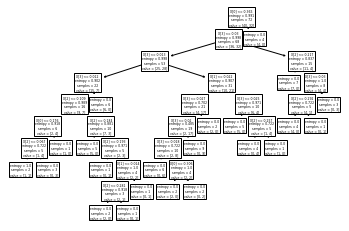

In [259]:
# Now we want to visualize the tree
tree.plot_tree(entr_model)

# We can do so with export_graphviz
tree.export_graphviz(entr_model)

# Alternatively for class_names use entr_model.classes_
entr_model.classes_

In [260]:
# Model 2: Gini impurity model - no max_depth
# Make a variable called gini_model, and assign it exactly what you assigned entr_model with above, but with the
# criterion changed to 'gini'
gini_model = tree.DecisionTreeClassifier(criterion='gini')

# Call fit() on the gini_model as you did with the entr_model
gini_model.fit(X_train, y_train)

# Call predict() on the gini_model as you did with the entr_model 
y_pred = gini_model.predict(X_test)

# Turn y_pred into a series, as before
pd.Series(y_pred)

# Check out gini_model
gini_model

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

array([0, 1])

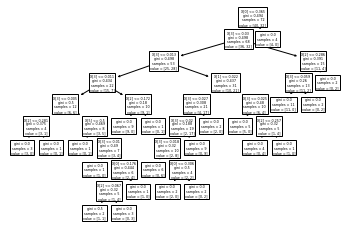

In [261]:
# As before, but make the model name gini_model
tree.plot_tree(gini_model)
tree.export_graphviz(gini_model)

# Alternatively for class_names use gini_model.classes_
gini_model.classes_

In [262]:
# Model 3: Entropy model - max depth 3
# Made a model as before, but call it entr_model2, and make the max_depth parameter equal to 3. 
# Execute the fitting, predicting, and Series operations as before
entr_model2 = tree.DecisionTreeClassifier(criterion='entropy', max_depth=3)

entr_model2.fit(X_train, y_train)

y_pred = entr_model2.predict(X_test)

pd.Series(y_pred)

entr_model2

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=3,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

array([0, 1])

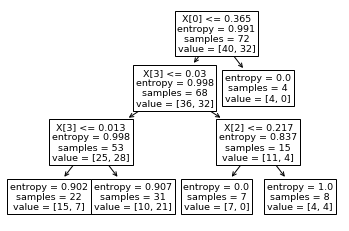

In [263]:
# As before, we need to visualize the tree to grasp its nature
tree.plot_tree(entr_model2)
tree.export_graphviz(entr_model2)

# Alternatively for class_names use entr_model2.classes_
entr_model2.classes_

In [300]:
tree3_probs = entr_model2.predict_proba(X_test)
tree3_probs = tree3_probs[:,1]
tree3_auc = roc_auc_score(y_test, tree3_probs)
tree3_fpr, tree3_tpr, _ = roc_curve(y_test, tree3_probs)

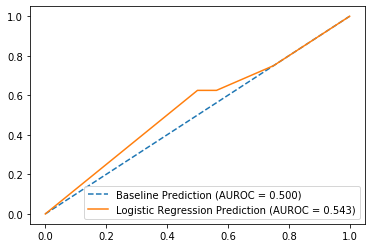

In [318]:
plt.plot(r_fpr, r_tpr, linestyle = '--', label='Baseline Prediction (AUROC = %0.3f)'%r_auc)
plt.plot(tree3_fpr, tree3_tpr, linestyle = '-', label='Logistic Regression Prediction (AUROC = %0.3f)'%tree3_auc)
plt.legend()

In [264]:
# Model 4: Gini impurity model - max depth 3
# As before, make a variable, but call it gini_model2, and ensure the max_depth parameter is set to 3
gini_model2 = tree.DecisionTreeClassifier(criterion='gini', random_state = 1234, max_depth  = 3)

# Do the fit, predict, and series transformations as before. 
gini_model2.fit(X_train, y_train)

y_pred = gini_model2.predict(X_test)

pd.Series(y_pred)

gini_model2

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=1234, splitter='best')

array([0, 1])

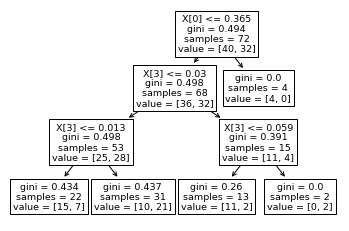

In [265]:
#dot_data = StringIO()
tree.plot_tree(gini_model2)
tree.export_graphviz(gini_model2)


# Alternatively for class_names use gini_model2.classes_
gini_model2.classes_

In [302]:
tree4_probs = gini_model2.predict_proba(X_test)
tree4_probs = tree4_probs[:,1]
tree4_auc = roc_auc_score(y_test, tree4_probs)
tree4_fpr, tree4_tpr, _ = roc_curve(y_test, tree4_probs)

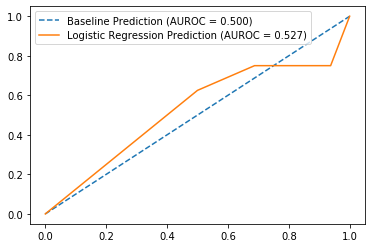

In [317]:
plt.plot(r_fpr, r_tpr, linestyle = '--', label='Baseline Prediction (AUROC = %0.3f)'%r_auc)
plt.plot(tree4_fpr, tree4_tpr, linestyle = '-', label='Logistic Regression Prediction (AUROC = %0.3f)'%tree4_auc)
plt.legend()

## Random Forest

In [266]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import classification_report,confusion_matrix,roc_curve,roc_auc_score
from sklearn.metrics import accuracy_score,log_loss
from matplotlib import pyplot

In [267]:
import time
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=300, random_state = 1,n_jobs=-1)
model_res = rf.fit(X_train, y_train)
y_pred = model_res.predict(X_test)
y_pred_prob = model_res.predict_proba(X_test)
lr_probs = y_pred_prob[:,1]
#lr_auc = roc_auc_score(y_test, lr_probs)
ac = accuracy_score(y_test, y_pred)
#lo = log_loss(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
cm = confusion_matrix(y_test, y_pred)
#print('Training Data Set 1 RandomForest: ROC AUC=%.3f' % (lr_auc))
print('Training Data Set 1 Random Forest: Accuracy=%.3f' % (ac))
#print('Training Data Set 1 Random Forest: Log loss=%.3f' % (lo))
print('Training Data Set 1 Random Forest: f1-score=%.3f' % (f1))

Training Data Set 1 Random Forest: Accuracy=0.625
Training Data Set 1 Random Forest: f1-score=0.618


In [304]:
rf_probs = model_res.predict_proba(X_test)
rf_probs = rf_probs[:,1]
rf_auc = roc_auc_score(y_test, rf_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)

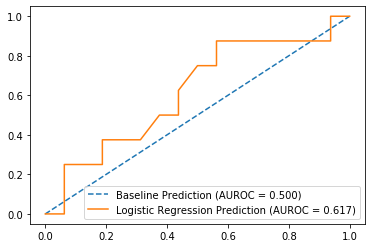

In [316]:
plt.plot(r_fpr, r_tpr, linestyle = '--', label='Baseline Prediction (AUROC = %0.3f)'%r_auc)
plt.plot(rf_fpr, rf_tpr, linestyle = '-', label='Logistic Regression Prediction (AUROC = %0.3f)'%rf_auc)
plt.legend()

## Plot feature importances

6


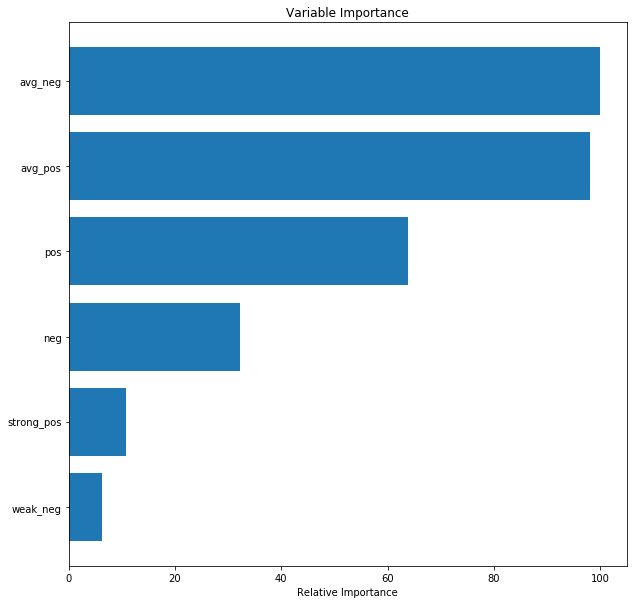

In [268]:
import numpy as np
import matplotlib.pyplot as plt
feature_importance = rf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())[:30]
sorted_idx = np.argsort(feature_importance)[:30]

pos = np.arange(sorted_idx.shape[0]) + .5
print(pos.size)
sorted_idx.size
plt.figure(figsize=(10,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

## Gradient Boosting

In [269]:
from sklearn.ensemble import GradientBoostingClassifier

In [270]:
learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1]
for learning_rate in learning_rates:
    gb = GradientBoostingClassifier(n_estimators=20, learning_rate = learning_rate, max_features=2, max_depth = 2, random_state = 0)
    gb.fit(X_train, y_train)
    print("Learning rate: ", learning_rate)
    print("Accuracy score (training): {0:.3f}".format(gb.score(X_train, y_train)))
    print("Accuracy score (validation): {0:.3f}".format(gb.score(X_test, y_test)))
    print()

Learning rate:  0.05
Accuracy score (training): 0.667
Accuracy score (validation): 0.667

Learning rate:  0.1
Accuracy score (training): 0.819
Accuracy score (validation): 0.625

Learning rate:  0.25
Accuracy score (training): 0.875
Accuracy score (validation): 0.625

Learning rate:  0.5
Accuracy score (training): 0.944
Accuracy score (validation): 0.667

Learning rate:  0.75
Accuracy score (training): 0.972
Accuracy score (validation): 0.667

Learning rate:  1
Accuracy score (training): 0.986
Accuracy score (validation): 0.625



In [310]:
gb = GradientBoostingClassifier(n_estimators=20, learning_rate = 0.5, max_features=2, max_depth = 2, random_state = 0)
gb.fit(X_train, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.5, loss='deviance', max_depth=2,
                           max_features=2, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=20,
                           n_iter_no_change=None, presort='auto',
                           random_state=0, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [311]:
gb_probs = gb.predict_proba(X_test)
gb_probs = gb_probs[:,1]
gb_auc = roc_auc_score(y_test, gb_probs)
gb_fpr, gb_tpr, _ = roc_curve(y_test, gb_probs)

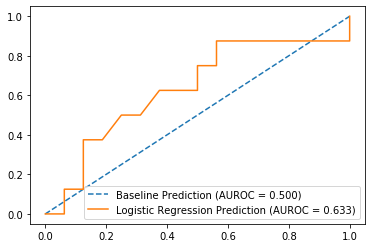

In [315]:
plt.plot(r_fpr, r_tpr, linestyle = '--', label='Baseline Prediction (AUROC = %0.3f)' %r_auc)
plt.plot(gb_fpr, gb_tpr, linestyle = '-', label='Logistic Regression Prediction (AUROC = %0.3f)' % gb_auc)
plt.legend()

## XGBoost

In [325]:
import xgboost as xgb

In [326]:
clf = xgb.XGBClassifier()
parameters = {
     "eta"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] ,
     "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
     "min_child_weight" : [ 1, 3, 5, 7 ],
     "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
     "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ]
     }

grid = GridSearchCV(clf,
                    parameters, n_jobs=4,
                    scoring="neg_log_loss",
                    cv=3)

grid.fit(X_train, y_train)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_l...
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=4,
             param_grid={'colsample_bytree': [0.3, 0.4, 0.5, 0.7],
                         'eta': [0.05, 0.1, 0.15, 0.2, 0.25, 0.3],
                         'gamma': [0.0, 0

In [327]:
print("Best Score:" + str(grid.best_score_))
print("Best Parameters: " + str(grid.best_params_))

Best Score:-0.687213211423821
Best Parameters: {'colsample_bytree': 0.3, 'eta': 0.05, 'gamma': 0.0, 'max_depth': 3, 'min_child_weight': 7}


In [328]:
xgb = xgb.XGBClassifier(colsample_bytree= 0.3, eta= 0.05, gamma= 0.0, max_depth= 3, min_child_weight= 7)
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, eta=0.05, gamma=0.0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=7, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [329]:
xgb_probs = xgb.predict_proba(X_test)
xgb_probs = xgb_probs[:,1]
xgb_auc = roc_auc_score(y_test, xgb_probs)
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, xgb_probs)

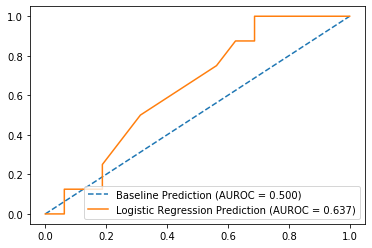

In [330]:
plt.plot(r_fpr, r_tpr, linestyle = '--', label='Baseline Prediction (AUROC = %0.3f)' %r_auc)
plt.plot(xgb_fpr, xgb_tpr, linestyle = '-', label='Logistic Regression Prediction (AUROC = %0.3f)' % xgb_auc)
plt.legend()

In [336]:
#conda install graphviz

Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


6


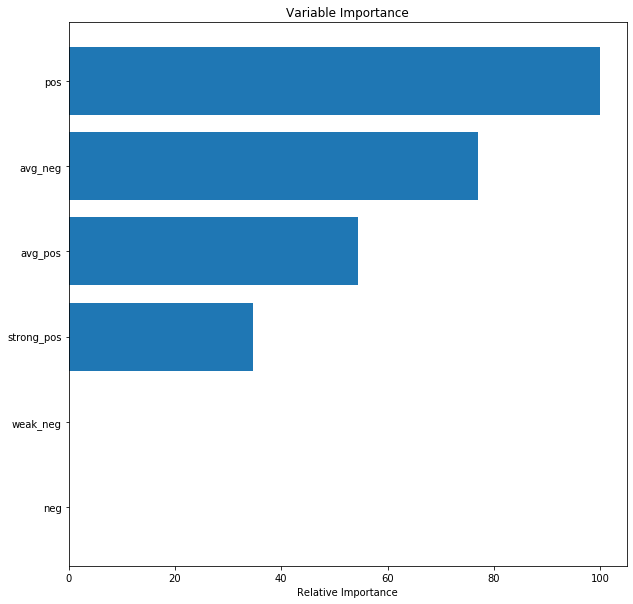

In [334]:
import numpy as np
import matplotlib.pyplot as plt
feature_importance = xgb.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())[:30]
sorted_idx = np.argsort(feature_importance)[:30]

pos = np.arange(sorted_idx.shape[0]) + .5
print(pos.size)
sorted_idx.size
plt.figure(figsize=(10,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()


## Hyperparameter Tuning: GradientBoosting

In [275]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
param_grid = {'learning_rate': (0.05, 0.1, 0.25, 0.5, 0.75, 1),'max_depth':np.arange(1,5),'n_estimators':np.arange(20,100,20),'max_features':np.arange(2,6,1)}
gb = GradientBoostingClassifier()
gb_cv= GridSearchCV(gb,param_grid,cv=5)
gb_cv.fit(X,y)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=GradientBoostingClassifier(criterion='friedman_mse',
                                                  init=None, learning_rate=0.1,
                                                  loss='deviance', max_depth=3,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=100,
                                                  n_iter_no...
                                                  random_state=None,

In [276]:
print("Best Score:" + str(gb_cv.best_score_))
print("Best Parameters: " + str(gb_cv.best_params_))

Best Score:0.53125
Best Parameters: {'learning_rate': 0.05, 'max_depth': 1, 'max_features': 4, 'n_estimators': 20}


In [321]:
gb = GradientBoostingClassifier(learning_rate= 0.05, max_depth= 1, max_features= 4, n_estimators= 20)

In [322]:
gb.fit(X_train, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.05, loss='deviance', max_depth=1,
                           max_features=4, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=20,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [323]:
gb_probs = gb.predict_proba(X_test)
gb_probs = gb_probs[:,1]
gb_auc = roc_auc_score(y_test, gb_probs)
gb_fpr, gb_tpr, _ = roc_curve(y_test, gb_probs)

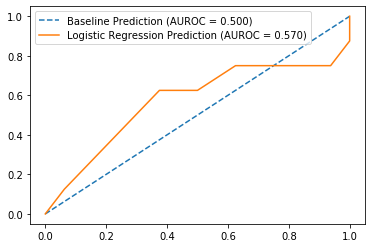

In [324]:
plt.plot(r_fpr, r_tpr, linestyle = '--', label='Baseline Prediction (AUROC = %0.3f)' %r_auc)
plt.plot(gb_fpr, gb_tpr, linestyle = '-', label='Logistic Regression Prediction (AUROC = %0.3f)' % gb_auc)
plt.legend()

## <b>Train Your Own Sentiment Model</b>

In [ ]:
# Train your own model: we use Yelp, Amazon, and IMDB labeled datasets from Kaggle to train our sentiment model. 
# We could use other labeled sentiment datasets such as Twitter, etc to train our model.
data_yelp = pd.read_table('yelp_labelled.txt')
data_amazon = pd.read_table('amazon_cells_labelled.txt')
data_imdb = pd.read_table('imdb_labelled.txt')

# Joining the tables
combined_col= [data_amazon,data_imdb,data_yelp]

# To observe how the data in each individual dataset is structured
print(data_amazon.columns)

In [ ]:
for colname in combined_col:
    colname.columns = ["Review","Label"]
for colname in combined_col:
    print(colname.columns)

In [ ]:
company = [ "Amazon", "imdb", "yelp"]

comb_data = pd.concat(combined_col,keys = company)

In [ ]:
# Exploring the  structure of  the new  data  frame

print(comb_data.shape)

comb_data.head()

In [ ]:
comb_data.to_csv("Sentiment_Analysis_Dataset")

print(comb_data.columns)

print(comb_data.isnull().sum())

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.metrics import accuracy_score 
from sklearn.base import TransformerMixin 
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC

In [ ]:
#Custom transformer using spaCy 
class predictors(TransformerMixin):
    def transform(self, X, **transform_params):
        return [clean_text(text) for text in X]
    def fit(self, X, y, **fit_params):
        return self
    def get_params(self, deep=True):
        return {}

# Basic function to clean the text 
def clean_text(text):     
    return text.strip().lower()

In [ ]:
# Vectorization
vectorizer = CountVectorizer(tokenizer = my_tokenizer, ngram_range=(1,1)) 
classifier = LinearSVC()

In [ ]:
# Using Tfidf
tfvectorizer = TfidfVectorizer(tokenizer =my_tokenizer)

In [ ]:
# Splitting Data Set
from sklearn.model_selection import train_test_split

In [ ]:
# Features and Labels
X = comb_data['Review']
ylabels = comb_data['Label']

X_train, X_test, y_train, y_test = train_test_split(X, ylabels, test_size=0.2, random_state=42)

## use predict proba 

In [ ]:
# Create the  pipeline to clean, tokenize, vectorize, and classify using"Count Vectorizor"
pipe_countvect = Pipeline([("cleaner", predictors()),
                 ('vectorizer', vectorizer),
                 ('classifier', classifier)])
# Fit our data
pipe_countvect.fit(X_train,y_train)

In [ ]:
# Predicting with a test dataset
sample_prediction = pipe_countvect.predict(X_test)

In [ ]:
# Prediction Results
# 1 = Positive review
# 0 = Negative review
for (sample,pred) in zip(X_test,sample_prediction):
    print(sample,"Prediction=>",pred)

In [ ]:
df_subset_consolidated.head()

In [ ]:
df_subset_consolidated['componentText_spacy'] = pipe_countvect.predict(df_subset_consolidated['componentText_processed'])

In [ ]:
df_subset_consolidated['bert_spacy'] = pipe_countvect.predict(df_subset_consolidated['bert'])

In [ ]:
df_subset_consolidated

## Topic Modeling with Gensim

In [341]:
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

In [342]:
# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

In [343]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))


In [371]:
df_topic = pd.concat([data3])

In [345]:
df_topic

,objectId,transcriptcreationdateUTC,componentText
0,106335,2018-01-03 16:08:15.000,"Ladies and gentlemen, thank you for standing b..."
1,106335,2018-01-03 16:08:15.000,"Thank you, Paula, and welcome, everyone to For..."
2,106335,2018-01-03 16:08:15.000,"Great. Thank you, Erich. Happy new year to eve..."
3,106335,2018-01-03 16:08:15.000,"Great. Thanks, Mark, and happy New Year's to e..."
4,106335,2018-01-03 16:08:15.000,"thank you, Emily. And taking a look, if we jus..."
...,...,...,...
290797,262247,2018-12-28 19:44:16.000,Okay. Productivity has been a hallmark of the ...
290798,262247,2018-12-28 19:44:16.000,I'll come back to the point I was making on da...
290799,262247,2018-12-28 19:44:16.000,"Right. Okay. Well, with that, we're out of tim..."
290800,262247,2018-12-28 19:44:16.000,"Thank you very much, Dara."


In [372]:
df_topic['date'] = pd.to_datetime(df_topic['transcriptcreationdateUTC'])

In [373]:
%%time
df_topic['componentText_tokenized'] = df_topic['componentText'].apply(lambda x: my_tokenizer(x))

CPU times: user 4min 51s, sys: 492 ms, total: 4min 51s
Wall time: 4min 51s


In [374]:
%%time
df_topic['componentText_processed'] = df_topic['componentText_tokenized'].apply(lambda x: ' '.join(x))

CPU times: user 625 ms, sys: 54.2 ms, total: 679 ms
Wall time: 678 ms


In [349]:
df_topic

,objectId,transcriptcreationdateUTC,componentText,date,componentText_tokenized,componentText_processed
0,106335,2018-01-03 16:08:15.000,"Ladies and gentlemen, thank you for standing b...",2018-01-03 16:08:15,"[ladies, gentleman, stand, welcome, ford, mont...",ladies gentleman stand welcome ford monthly sa...
1,106335,2018-01-03 16:08:15.000,"Thank you, Paula, and welcome, everyone to For...",2018-01-03 16:08:15,"[paula, welcome, ford, december, 2017, u.s., s...",paula welcome ford december 2017 u.s. sales ha...
2,106335,2018-01-03 16:08:15.000,"Great. Thank you, Erich. Happy new year to eve...",2018-01-03 16:08:15,"[great, erich, happy, new, year, detroit, new,...",great erich happy new year detroit new york ho...
3,106335,2018-01-03 16:08:15.000,"Great. Thanks, Mark, and happy New Year's to e...",2018-01-03 16:08:15,"[great, thanks, mark, happy, new, year, talk, ...",great thanks mark happy new year talk 2018 com...
4,106335,2018-01-03 16:08:15.000,"thank you, Emily. And taking a look, if we jus...",2018-01-03 16:08:15,"[emily, look, look, industry, trend, month, de...",emily look look industry trend month december ...
...,...,...,...,...,...,...
290797,262247,2018-12-28 19:44:16.000,Okay. Productivity has been a hallmark of the ...,2018-12-28 19:44:16,"[okay, productivity, hallmark, colgate, organi...",okay productivity hallmark colgate organizatio...
290798,262247,2018-12-28 19:44:16.000,I'll come back to the point I was making on da...,2018-12-28 19:44:16,"[come, point, datum, hire, --, point, mention,...",come point datum hire -- point mention cultura...
290799,262247,2018-12-28 19:44:16.000,"Right. Okay. Well, with that, we're out of tim...",2018-12-28 19:44:16,"[right, okay, time, head, breakout, room, come...",right okay time head breakout room come apprec...
290800,262247,2018-12-28 19:44:16.000,"Thank you very much, Dara.",2018-12-28 19:44:16,[dara],dara


In [ ]:
# %%time
# df_topic['month'] = df_topic['date'].apply(lambda x: x.month)
# df_topic['year'] = df_topic['date'].apply(lambda x: x.year)
# df_topic_consolidated=df_topic.groupby(['objectId','year','month'])['componentText_processed'].apply(' '.join)

In [ ]:
# df_topic_consolidated = pd.DataFrame(df_topic_consolidated)

In [ ]:
# df_topic_consolidated

In [ ]:
# %%time
# df_topic_consolidated['bert'] = df_topic_consolidated['componentText_processed'].apply(lambda x: model(x, min_length=100))

In [375]:
data = df_topic.componentText_processed.values.tolist()

In [376]:
data_words = list(sent_to_words(data))

In [352]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['ladies_gentleman', 'stand', 'welcome', 'ford', 'monthly', 'sales', 'operator_instructions', 'like', 'turn', 'conference', 'mr_erich_merkle', 'sale', 'analyst', 'sir', 'begin']


In [353]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [354]:
%%time
# Form Bigrams
data_words_bigrams = make_bigrams(data_words)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
#nlp = spacy.load('en', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])


CPU times: user 2h 25min 45s, sys: 35.8 s, total: 2h 26min 21s
Wall time: 56min 58s


In [355]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 2), (9, 1), (10, 1), (11, 1), (12, 1)]]


In [356]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('analyst', 1),
  ('begin', 1),
  ('conference', 1),
  ('erich_merkle', 1),
  ('ford', 1),
  ('ladies_gentleman', 1),
  ('monthly', 1),
  ('operator_instruction', 1),
  ('sale', 2),
  ('sir', 1),
  ('stand', 1),
  ('turn', 1),
  ('welcome', 1)]]

In [357]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=25,
                                           alpha='auto',
                                           per_word_topics=True)

In [358]:
from pprint import pprint
# Print the Keyword in the topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.037*"year" + 0.027*"quarter" + 0.021*"rate" + 0.019*"capital" + '
  '0.016*"basis" + 0.016*"impact" + 0.015*"increase" + 0.014*"share" + '
  '0.014*"sale" + 0.013*"cash"'),
 (1,
  '0.030*"customer" + 0.030*"product" + 0.025*"new" + 0.019*"opportunity" + '
  '0.017*"work" + 0.015*"value" + 0.014*"technology" + 0.014*"build" + '
  '0.012*"world" + 0.012*"different"'),
 (2,
  '0.066*"today" + 0.023*"forward" + 0.021*"join" + 0.021*"presentation" + '
  '0.018*"thank" + 0.018*"financial" + 0.017*"question" + 0.017*"morning" + '
  '0.017*"measure" + 0.016*"turn"'),
 (3,
  '0.044*"store" + 0.034*"use" + 0.033*"digital" + 0.032*"platform" + '
  '0.028*"people" + 0.025*"datum" + 0.021*"consumer" + 0.020*"doe" + '
  '0.018*"cloud" + 0.016*"goal"'),
 (4,
  '0.046*"cost" + 0.032*"process" + 0.032*"key" + 0.025*"follow" + '
  '0.024*"category" + 0.022*"pipeline" + 0.021*"center" + 0.020*"significant" '
  '+ 0.018*"order" + 0.015*"project"'),
 (5,
  '0.060*"think" + 0.030*"look" + 0.022*"g

## Visualize the topics with pyLDAvis

In [359]:

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

/opt/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.217257  0.094058       1        1  26.795742
1      0.117236  0.082358       2        1  17.075779
0      0.204432 -0.123555       3        1  14.835636
8      0.206646  0.081971       4        1  14.435991
3     -0.187032  0.239956       5        1   5.453196
4     -0.222099 -0.190299       6        1   5.032515
6     -0.048538 -0.291192       7        1   4.969089
9     -0.117416  0.046980       8        1   4.040337
2      0.005021 -0.095788       9        1   3.682239
7     -0.175507  0.155511      10        1   3.679484, topic_info=     Category           Freq      Term          Total  loglift  logprob
151   Default  136487.000000    market  136487.000000  30.0000  30.0000
243   Default  269289.000000     think  269289.000000  29.0000  29.0000
56    Default  172801.000000  business  172801.000000  28.0000  28.0000
306   Default  147846.000000    growth  147846.000000  27.0000  27.0000
34    Default  226681.000000      year  226681.000000  26.0000  26.0000
...       ...            ...       ...            ...      ...      ...
1221  Topic10    9171.682617    target   26040.468750   2.2589  -4.2151
976   Topic10    6598.458008       set   22863.482422   2.0597  -4.5444
436   Topic10    6039.958984     early   38873.164062   1.4405  -4.6328
99    Topic10    4789.987305    excite   19614.548828   1.8927  -4.8647
73    Topic10    4359.986328    course   27160.837891   1.4731  -4.9587

[475 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
443       1  0.999978         able
1062      2  0.990387       access
1062      9  0.009595       access
385       3  0.999934      account
1802      4  0.999976  acquisition
...     ...       ...          ...
261       2  0.768938         work
894       2  0.999974        world
34        1  0.147238         year
34        3  0.406395         year
34        4  0.446363         year

[623 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 2, 1, 9, 4, 5, 7, 10, 3, 8])

In [360]:
# How to find the optimal number of topics for LDA?
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [361]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=2, limit=25, step=2)

KeyboardInterrupt: 

In [ ]:
# Show graph
limit=25; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

## Word Cloud

In [362]:
from wordcloud import WordCloud

In [377]:
words = ''
for i in range(len(data_words[0])): 
        data_words[0][i] = data_words[0][i].lower() 
      
        words += " ".join(data_words[0])+" "

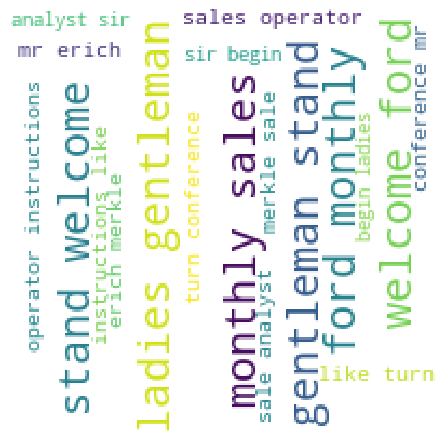

In [379]:
wordcloud = WordCloud(width = 200, height = 200, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 8).generate(words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (6, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

## PCA and visualization with T-SNE

In [365]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import numpy as np
import matplotlib.colors as mcolors

In [366]:
# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 159232 samples in 0.115s...
[t-SNE] Computed neighbors for 159232 samples in 58.465s...
[t-SNE] Computed conditional probabilities for sample 1000 / 159232
[t-SNE] Computed conditional probabilities for sample 2000 / 159232
[t-SNE] Computed conditional probabilities for sample 3000 / 159232
[t-SNE] Computed conditional probabilities for sample 4000 / 159232
[t-SNE] Computed conditional probabilities for sample 5000 / 159232
[t-SNE] Computed conditional probabilities for sample 6000 / 159232
[t-SNE] Computed conditional probabilities for sample 7000 / 159232
[t-SNE] Computed conditional probabilities for sample 8000 / 159232
[t-SNE] Computed conditional probabilities for sample 9000 / 159232
[t-SNE] Computed conditional probabilities for sample 10000 / 159232
[t-SNE] Computed conditional probabilities for sample 11000 / 159232
[t-SNE] Computed conditional probabilities for sample 12000 / 159232
[t-SNE] Computed conditional probab

[t-SNE] Computed conditional probabilities for sample 125000 / 159232
[t-SNE] Computed conditional probabilities for sample 126000 / 159232
[t-SNE] Computed conditional probabilities for sample 127000 / 159232
[t-SNE] Computed conditional probabilities for sample 128000 / 159232
[t-SNE] Computed conditional probabilities for sample 129000 / 159232
[t-SNE] Computed conditional probabilities for sample 130000 / 159232
[t-SNE] Computed conditional probabilities for sample 131000 / 159232
[t-SNE] Computed conditional probabilities for sample 132000 / 159232
[t-SNE] Computed conditional probabilities for sample 133000 / 159232
[t-SNE] Computed conditional probabilities for sample 134000 / 159232
[t-SNE] Computed conditional probabilities for sample 135000 / 159232
[t-SNE] Computed conditional probabilities for sample 136000 / 159232
[t-SNE] Computed conditional probabilities for sample 137000 / 159232
[t-SNE] Computed conditional probabilities for sample 138000 / 159232
[t-SNE] Computed con

In [368]:
# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 10
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

Loading BokehJS ...